# <center>Análisis Complejidad Electoral 2019: Municipios <center>
## <center>Análisis Exploratorio y Construcción Índices de Complejidad Electoral <center>

<br>

#### <center>INFOTEC-Maestría en Ciencia de Datos e Información <center>
#### <center>Autor: Miguel David Alvarez Hernández (mdalvarezh@gmail.com)<center>

In [1]:
import datetime
now = datetime.datetime.now()
print ("Última versión:")
print (now.strftime("%Y-%m-%d %H:%M:%S"))

Última versión:
2020-09-17 10:18:10


# Setup

In [2]:
import pandas as pd  
import numpy as np
import pandas_profiling
from itertools import combinations 
from dateutil.parser import parse 
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.express as px

In [3]:
#parámetros de las gráficas 3d
elev = 50.0
azim = 10.0

# Importación de datos procesados

In [4]:
#datos procesados
datos = pd.read_csv("C:/Users/miguel.alvarez/Google Drive/INFOTEC/Proyecto/Code-Data/Mun/1_Procesamiento/Resultados_Datos-procesados_mun2019.csv", encoding='utf-8')

In [5]:
print(datos.dtypes)
datos

EDO                   int64
NOMBRE_ESTADO        object
MUN                   int64
NOMBRE_MUNICIPIO     object
Coef_Var_PE         float64
Coef_Var_LNE        float64
Var_Prop_PE         float64
Var_Prop_LNE        float64
Autocorr_PE         float64
Autocorr_LNE        float64
Razon_LNE_PE        float64
PE                  float64
LNE                 float64
TC_LNE_2019         float64
NUM_SECC_RUR          int64
Area_Km2            float64
Densidad_LNE        float64
dtype: object


,EDO,NOMBRE_ESTADO,MUN,NOMBRE_MUNICIPIO,Coef_Var_PE,Coef_Var_LNE,Var_Prop_PE,Var_Prop_LNE,Autocorr_PE,Autocorr_LNE,Razon_LNE_PE,PE,LNE,TC_LNE_2019,NUM_SECC_RUR,Area_Km2,Densidad_LNE
0,1,AGUASCALIENTES,10,SAN FRANCISCO DE LOS ROMO,0.017131,0.015085,0.020041,0.017733,0.965775,0.755939,0.989272,35518.0,34917.0,0.037498,3,9.791576,3566.024547
1,1,AGUASCALIENTES,8,SAN JOSE DE GRACIA,0.005040,0.008345,0.005584,0.008887,0.435676,0.237061,0.991803,7004.0,6914.0,0.000289,4,148.866104,46.444421
2,1,AGUASCALIENTES,9,TEPEZALA,0.006879,0.011777,0.007903,0.011921,0.605737,0.344567,0.990635,15733.0,15545.0,0.005108,6,6.271495,2478.675412
3,1,AGUASCALIENTES,11,EL LLANO,0.008917,0.012239,0.009983,0.014232,0.585621,0.504020,0.991016,15298.0,15067.0,-0.003373,6,10.006312,1505.749552
4,1,AGUASCALIENTES,2,ASIENTOS,0.008083,0.013432,0.009252,0.015397,0.581193,0.374738,0.989080,34722.0,34222.0,0.001874,11,23.049424,1484.722551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2453,32,ZACATECAS,45,TEPECHITLAN,0.014994,0.019408,0.017748,0.021905,0.987834,0.959378,0.983523,7061.0,6959.0,0.066677,13,190.978234,36.438707
2454,32,ZACATECAS,14,GENERAL FRANCISCO R. MURGUIA,0.019415,0.022769,0.022931,0.026072,0.964977,0.984897,0.986450,17610.0,17372.0,0.082705,32,1190.248462,14.595272
2455,32,ZACATECAS,44,TABASCO,0.027363,0.029823,0.032716,0.035416,0.992677,0.993335,0.983221,12689.0,12527.0,0.100307,16,235.714183,53.144872
2456,32,ZACATECAS,9,CHALCHIHUITES,0.016451,0.021097,0.019649,0.024771,0.975279,0.988608,0.982861,8339.0,8222.0,0.075052,10,13.707054,599.837116


In [6]:
#se reordena y eliminan del dataframe las variables que no se usarán
datos_mun = datos.drop(columns=['Coef_Var_PE', 'Var_Prop_PE', 'Autocorr_PE','Area_Km2'])
datos_mun = datos_mun.reindex(columns= ['EDO','NOMBRE_ESTADO','MUN','NOMBRE_MUNICIPIO','NUM_SECC_RUR','LNE','Densidad_LNE','Razon_LNE_PE','TC_LNE_2019','Coef_Var_LNE','Var_Prop_LNE','Autocorr_LNE'])

#verificar si hay valores nulos en datos_mun
datos_mun.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
NUM_SECC_RUR        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        0
dtype: int64

In [7]:
#se eliminan las filas (municipios) con valores vacíos
datos_mun_limpio = datos_mun.dropna()
datos_mun_limpio = datos_mun_limpio.reset_index(drop=True) #para reordenar el índice del nuevo dataframe
datos_mun_limpio.isnull().sum()

EDO                 0
NOMBRE_ESTADO       0
MUN                 0
NOMBRE_MUNICIPIO    0
NUM_SECC_RUR        0
LNE                 0
Densidad_LNE        0
Razon_LNE_PE        0
TC_LNE_2019         0
Coef_Var_LNE        0
Var_Prop_LNE        0
Autocorr_LNE        0
dtype: int64

In [8]:
#se separan los indicadores de los metadatos 

#metadatos
metadatos = datos_mun_limpio[['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO']]
metadatos.head()

#indicadores (features)
datos_mun_limpio_f = datos_mun_limpio[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE','Autocorr_LNE']]
datos_mun_limpio_f

,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
0,3,34917.0,3566.024547,0.989272,0.037498,0.015085,0.017733,0.755939
1,4,6914.0,46.444421,0.991803,0.000289,0.008345,0.008887,0.237061
2,6,15545.0,2478.675412,0.990635,0.005108,0.011777,0.011921,0.344567
3,6,15067.0,1505.749552,0.991016,-0.003373,0.012239,0.014232,0.504020
4,11,34222.0,1484.722551,0.989080,0.001874,0.013432,0.015397,0.374738
...,...,...,...,...,...,...,...,...
2453,13,6959.0,36.438707,0.983523,0.066677,0.019408,0.021905,0.959378
2454,32,17372.0,14.595272,0.986450,0.082705,0.022769,0.026072,0.984897
2455,16,12527.0,53.144872,0.983221,0.100307,0.029823,0.035416,0.993335
2456,10,8222.0,599.837116,0.982861,0.075052,0.021097,0.024771,0.988608


## Análisis exploratorio de los indicadores base (sin transformar)

In [9]:
#resumen estadístico
datos_mun_limpio_f.describe()

,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
count,2458.000000,2.458000e+03,2458.000000,2458.000000,2458.000000,2458.000000,2458.000000,2458.000000
mean,7.703417,3.666356e+04,973.586826,0.985809,0.052819,0.020293,0.023623,0.856725
std,11.294857,1.091120e+05,1750.524307,0.005719,0.037315,0.008431,0.009546,0.214835
min,0.000000,6.100000e+01,0.595349,0.933182,-0.250000,0.002178,0.002555,-0.376887
25%,1.000000,3.299750e+03,70.126070,0.984144,0.033430,0.014870,0.017201,0.837310
50%,4.000000,9.664000e+03,395.965033,0.987232,0.056415,0.019360,0.022692,0.964930
75%,10.000000,2.452250e+04,1249.984627,0.989109,0.074956,0.024499,0.028862,0.988236
max,149.000000,1.463720e+06,24276.021766,0.997168,0.275049,0.098169,0.084949,0.998982


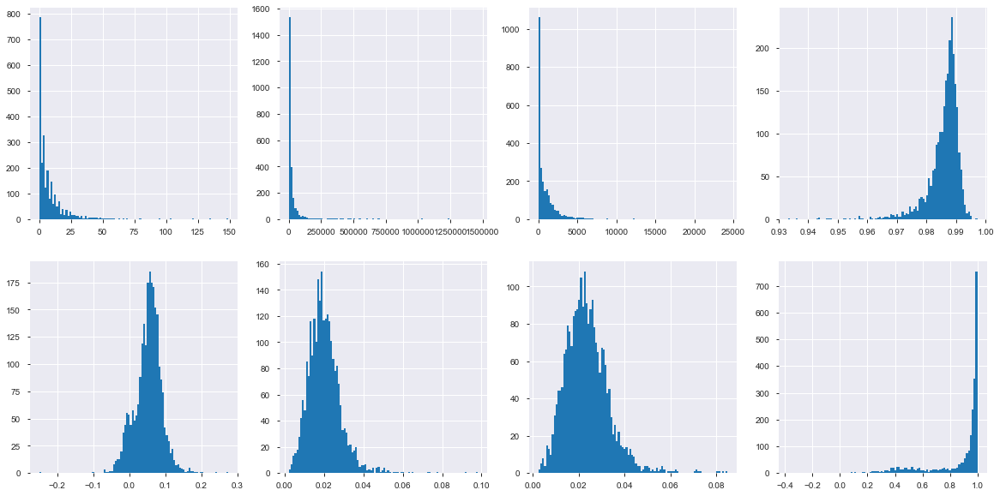

In [10]:
#histogramas de los indicadores base 
#print(sum(datos_mun['LNE'] > 500000))
plt.figure(figsize=(20,10)) 

plt.subplot(241)
H = plt.hist(datos_mun_limpio_f['NUM_SECC_RUR'], bins = 100)
plt.subplot(242)
H = plt.hist(datos_mun_limpio_f['LNE'], bins = 100)
plt.subplot(243)
H = plt.hist(datos_mun_limpio_f['Densidad_LNE'], bins = 100)
plt.subplot(244)
H = plt.hist(datos_mun_limpio_f['Razon_LNE_PE'], bins = 100)
plt.subplot(245)
H = plt.hist(datos_mun_limpio_f['TC_LNE_2019'], bins = 100)
plt.subplot(246)
H = plt.hist(datos_mun_limpio_f['Coef_Var_LNE'], bins = 100)
plt.subplot(247)
H = plt.hist(datos_mun_limpio_f['Var_Prop_LNE'], bins = 100)
plt.subplot(248)
H = plt.hist(datos_mun_limpio_f['Autocorr_LNE'], bins = 100)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (8 indicadores)

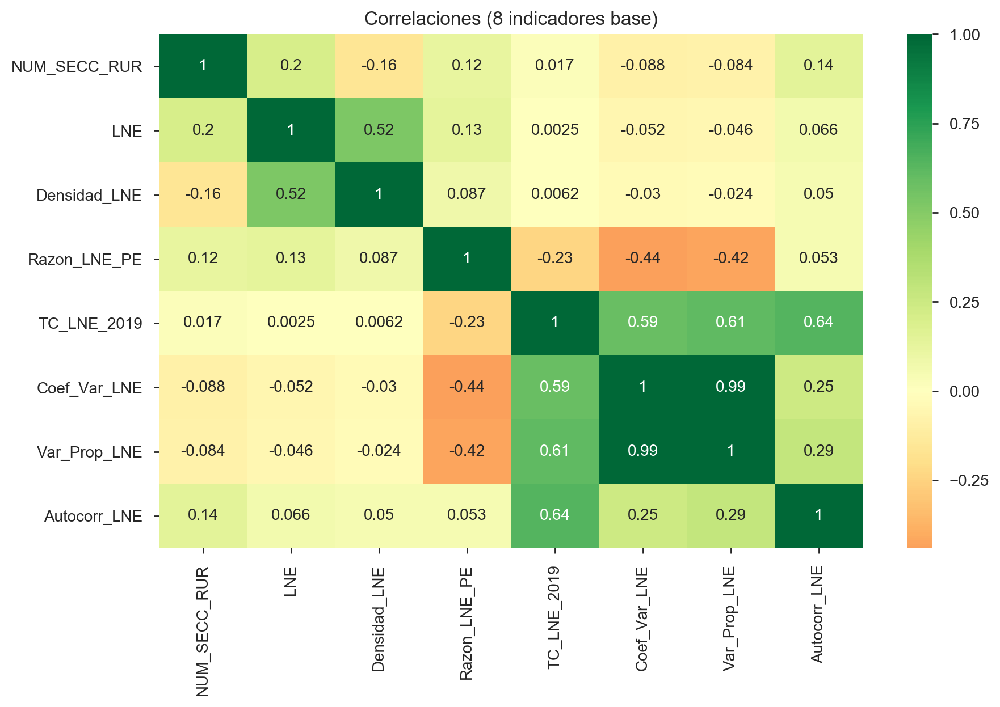

In [11]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_mun_limpio_f.corr(), xticklabels=datos_mun_limpio_f.corr().columns, yticklabels=datos_mun_limpio_f.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlaciones (8 indicadores base)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind8.png',dpi=600, bbox_inches="tight")
plt.show() 

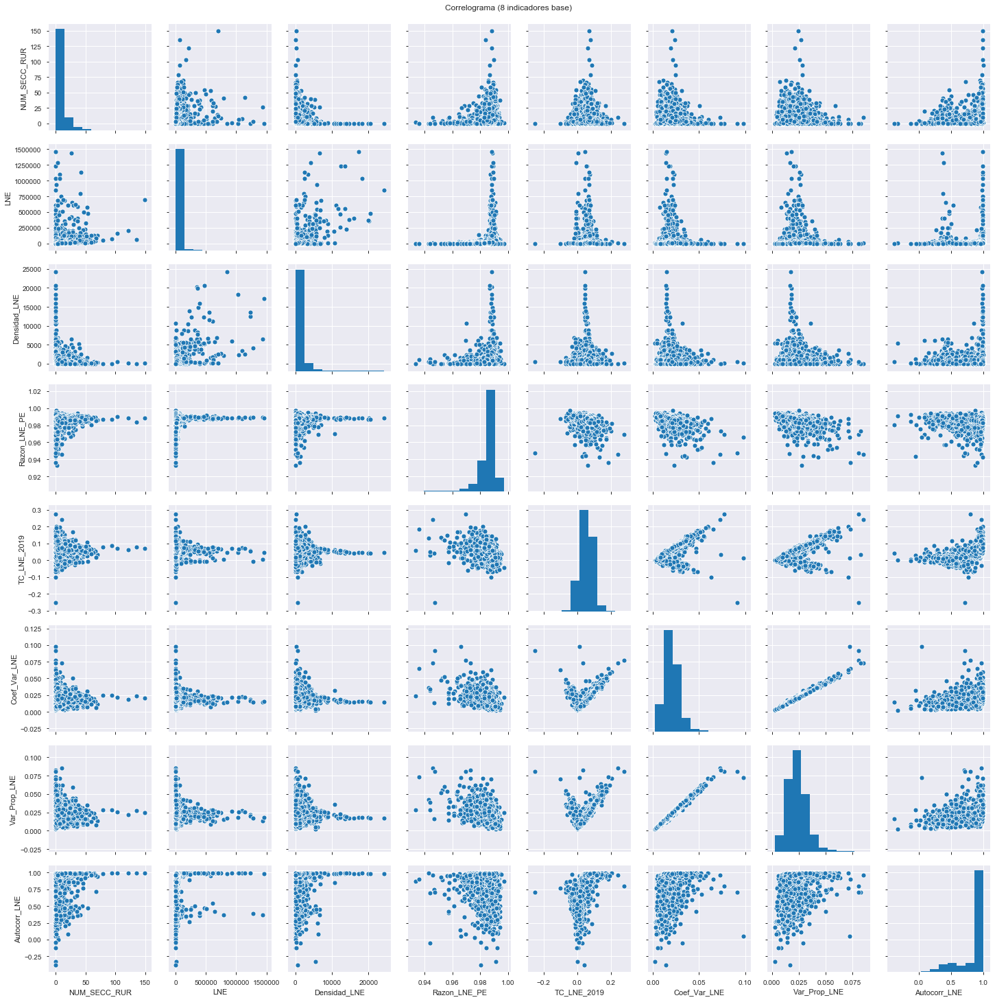

In [12]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr1 = sns.pairplot(datos_mun_limpio_f)
corr1.fig.suptitle("Correlograma (8 indicadores base)", y=1.01)
corr1.savefig('Pyplot_correlogram_ind8.png',dpi=600)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (7 indicadores)

In [13]:
datos_mun_limpio_f_ind7 = datos_mun_limpio_f[['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE','Autocorr_LNE']]

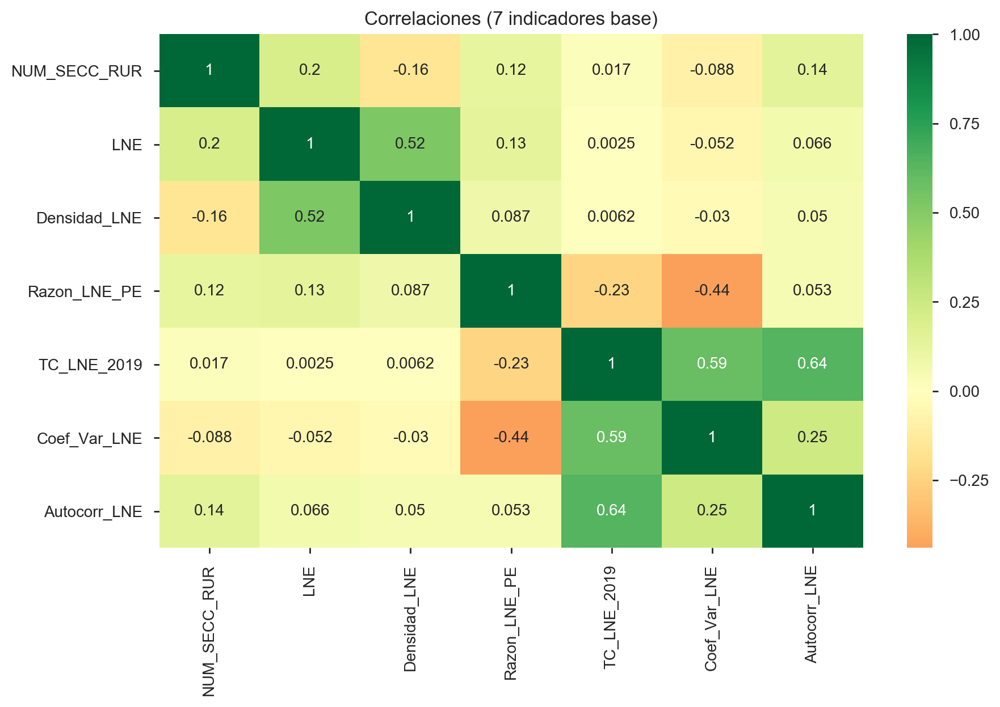

In [14]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_mun_limpio_f_ind7.corr(), xticklabels=datos_mun_limpio_f_ind7.corr().columns, yticklabels=datos_mun_limpio_f_ind7.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlaciones (7 indicadores base)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind7.png',dpi=600,bbox_inches="tight")
plt.show() 

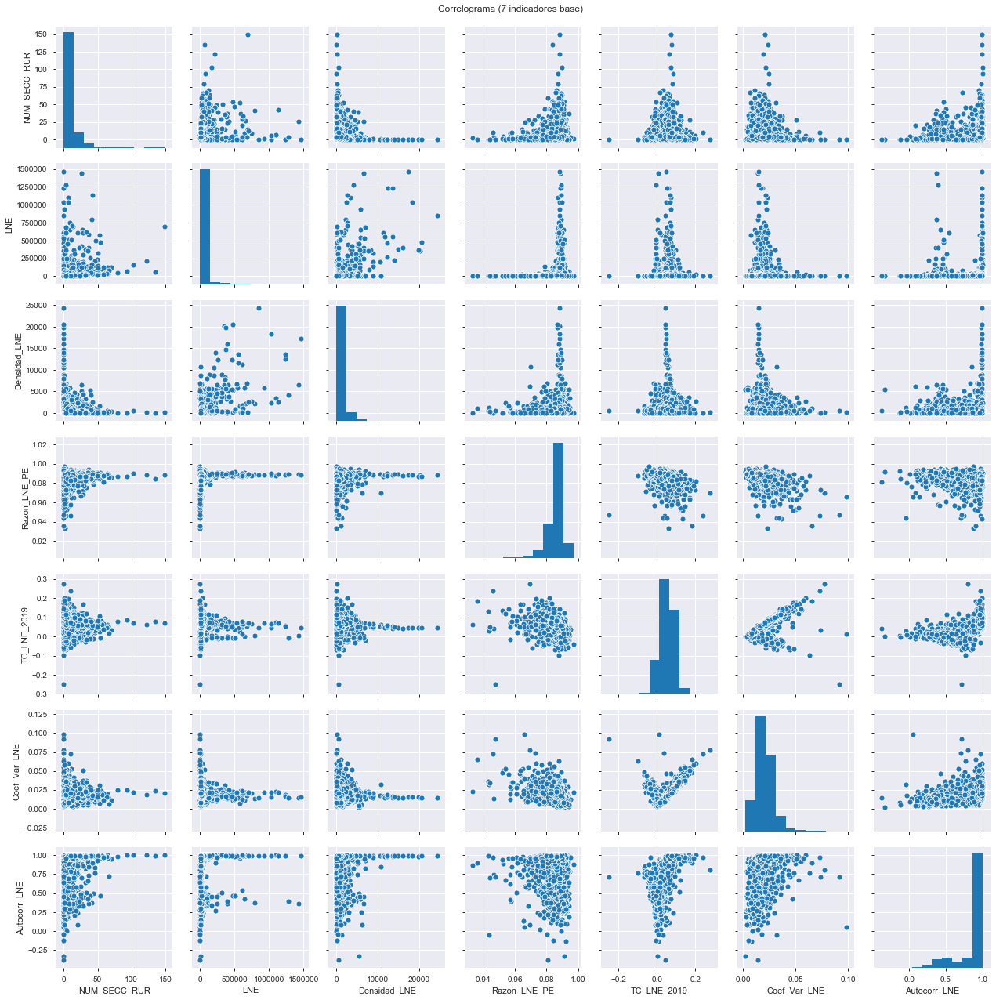

In [15]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr2_tf = sns.pairplot(datos_mun_limpio_f_ind7)
corr2_tf.fig.suptitle("Correlograma (7 indicadores base)", y=1.01)
corr2_tf.savefig('Pyplot_correlogram_ind7.png',dpi=600)

<br>

## Análisis exploratorio de los indicadores base (8 indicadores con transformación log en LNE y Densidad_LNE)

In [16]:
#se transforman algunos indicadores para analizar escenarios
datos_mun_limpio_f_tf = datos_mun_limpio_f.copy()

#np-log de LNE, Densidad
datos_mun_limpio_f_tf['LNE'] = np.log(datos_mun_limpio_f_tf['LNE'])
datos_mun_limpio_f_tf['Densidad_LNE'] = np.log(datos_mun_limpio_f_tf['Densidad_LNE'])
#datos_mun_limpio_f_tf['NUM_SECC_RUR'] = np.log(datos_mun_limpio_f_tf['NUM_SECC_RUR']+1)

#renombramos algunas columnas
datos_mun_limpio_f_tf=datos_mun_limpio_f_tf.rename(columns={"LNE": "log(LNE)", "Densidad_LNE": "log(Densidad_LNE)"})

#resumen estadístico
datos_mun_limpio_f_tf.describe()

,NUM_SECC_RUR,log(LNE),log(Densidad_LNE),Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
count,2458.000000,2458.000000,2458.000000,2458.000000,2458.000000,2458.000000,2458.000000,2458.000000
mean,7.703417,9.163503,5.600581,0.985809,0.052819,0.020293,0.023623,0.856725
std,11.294857,1.562039,1.931647,0.005719,0.037315,0.008431,0.009546,0.214835
min,0.000000,4.110874,-0.518608,0.933182,-0.250000,0.002178,0.002555,-0.376887
25%,1.000000,8.101602,4.250294,0.984144,0.033430,0.014870,0.017201,0.837310
50%,4.000000,9.176163,5.981325,0.987232,0.056415,0.019360,0.022692,0.964930
75%,10.000000,10.107346,7.130887,0.989109,0.074956,0.024499,0.028862,0.988236
max,149.000000,14.196492,10.097244,0.997168,0.275049,0.098169,0.084949,0.998982


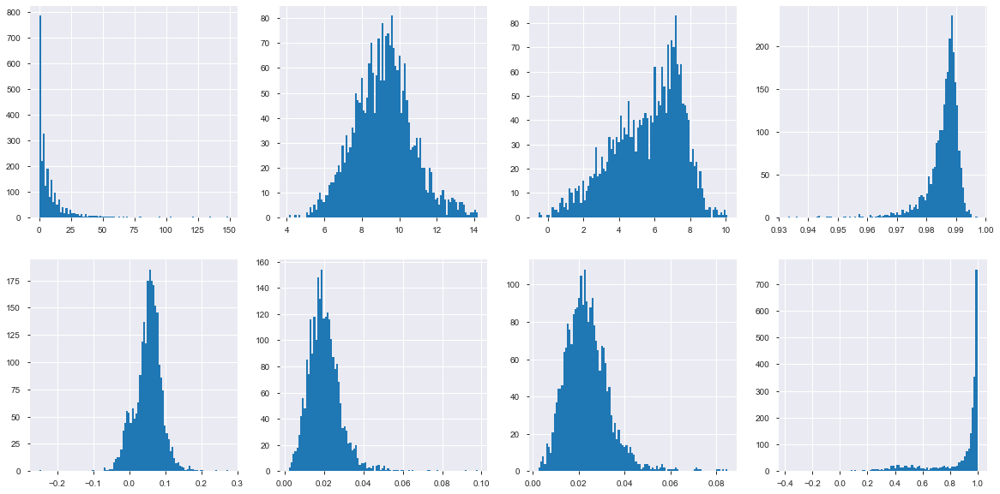

In [17]:
#histogramas de los indicadores base 
#print(sum(datos_mun['log(LNE')] > 500000))
plt.figure(figsize=(20,10)) 

plt.subplot(241)
H = plt.hist(datos_mun_limpio_f_tf['NUM_SECC_RUR'], bins = 100)
plt.subplot(242)
H = plt.hist(datos_mun_limpio_f_tf['log(LNE)'], bins = 100)
plt.subplot(243)
H = plt.hist(datos_mun_limpio_f_tf['log(Densidad_LNE)'], bins = 100)
plt.subplot(244)
H = plt.hist(datos_mun_limpio_f_tf['Razon_LNE_PE'], bins = 100)
plt.subplot(245)
H = plt.hist(datos_mun_limpio_f_tf['TC_LNE_2019'], bins = 100)
plt.subplot(246)
H = plt.hist(datos_mun_limpio_f_tf['Coef_Var_LNE'], bins = 100)
plt.subplot(247)
H = plt.hist(datos_mun_limpio_f_tf['Var_Prop_LNE'], bins = 100)
plt.subplot(248)
H = plt.hist(datos_mun_limpio_f_tf['Autocorr_LNE'], bins = 100)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (8 indicadores con transformación log)

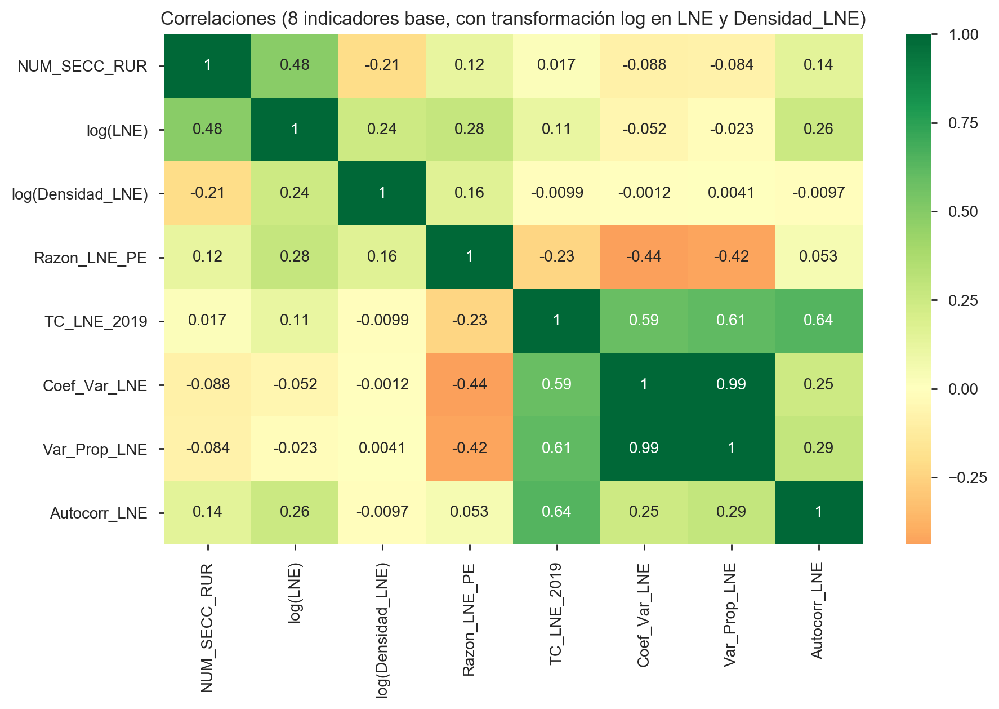

In [18]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_mun_limpio_f_tf.corr(), xticklabels=datos_mun_limpio_f_tf.corr().columns, yticklabels=datos_mun_limpio_f_tf.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlaciones (8 indicadores base, con transformación log en LNE y Densidad_LNE)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind8_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

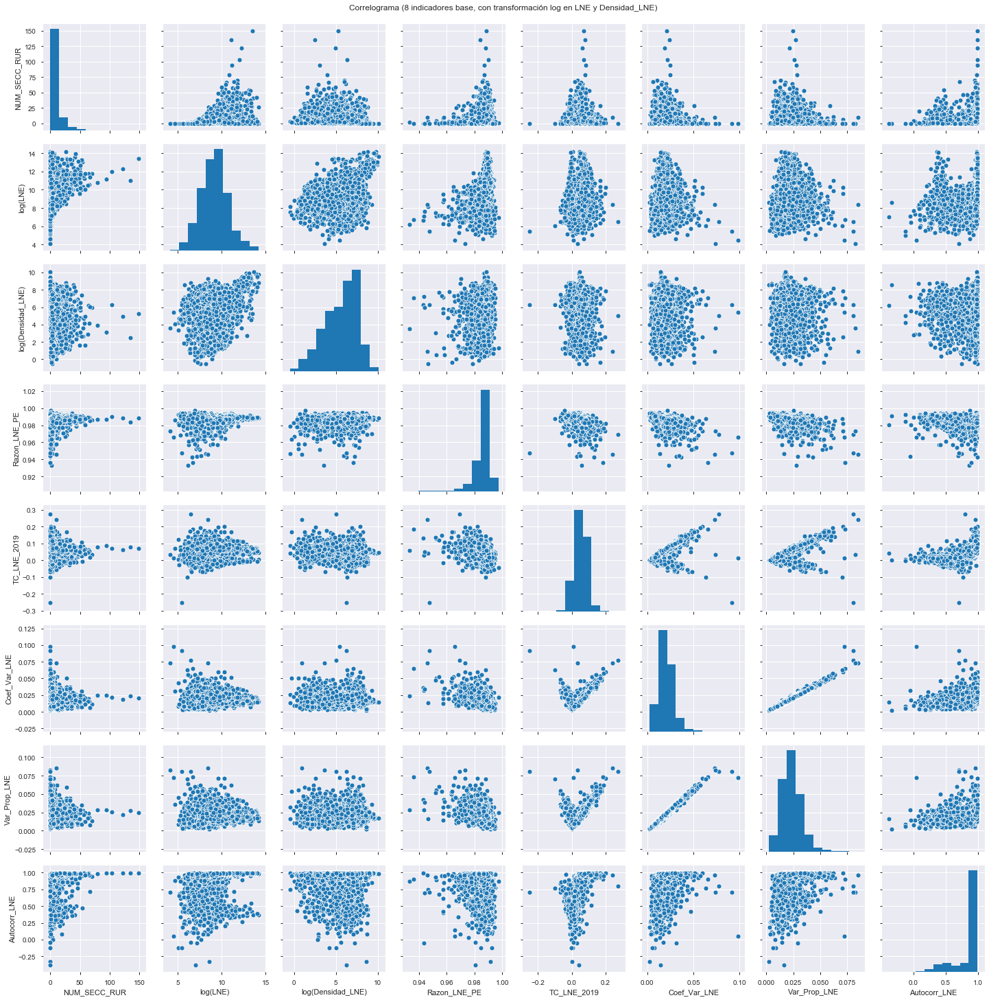

In [19]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr1_tf = sns.pairplot(datos_mun_limpio_f_tf)
corr1_tf.fig.suptitle("Correlograma (8 indicadores base, con transformación log en LNE y Densidad_LNE)", y=1.01)
corr1_tf.savefig('Pyplot_correlogram_ind8_tf.png',dpi=600)

<br>

## Gráficas (heatmap y pair-plot) y análisis de correlación (7 indicadores con transformación log)

In [20]:
datos_mun_limpio_f_tf_ind7 = datos_mun_limpio_f_tf[['NUM_SECC_RUR','log(LNE)', 'log(Densidad_LNE)', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE','Autocorr_LNE']]

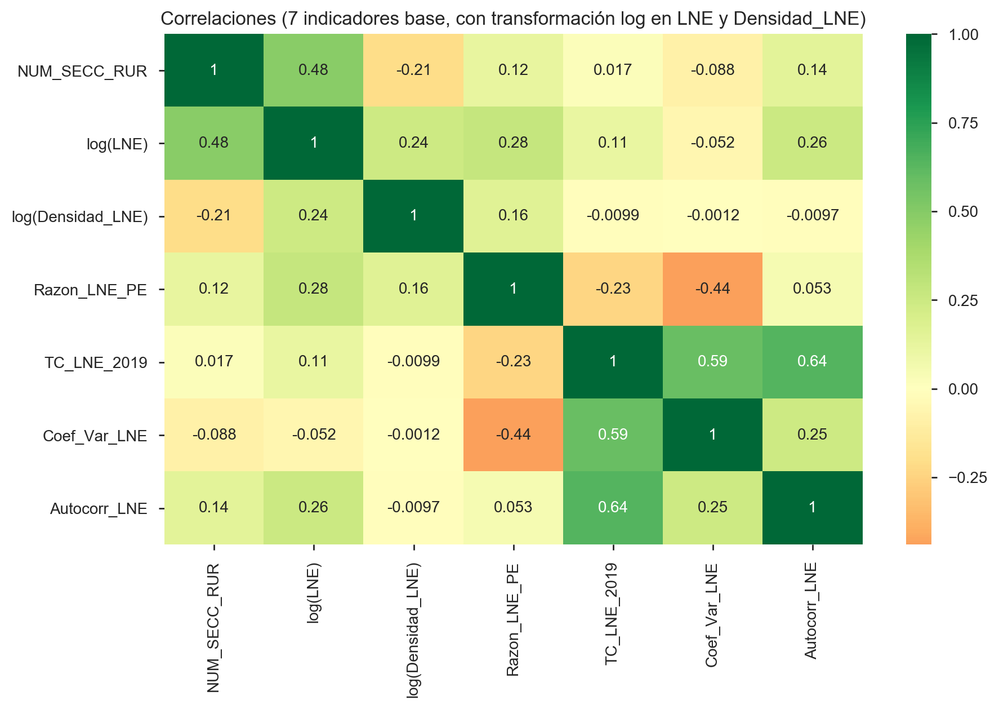

In [21]:
#Plot correlogram
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)

plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(datos_mun_limpio_f_tf_ind7.corr(), xticklabels=datos_mun_limpio_f_tf_ind7.corr().columns, yticklabels=datos_mun_limpio_f_tf_ind7.corr().columns, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Correlaciones (7 indicadores base, con transformación log en LNE y Densidad_LNE)')

#se guarda la grafica
plt.savefig('Pyplot_heatmap_ind7_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

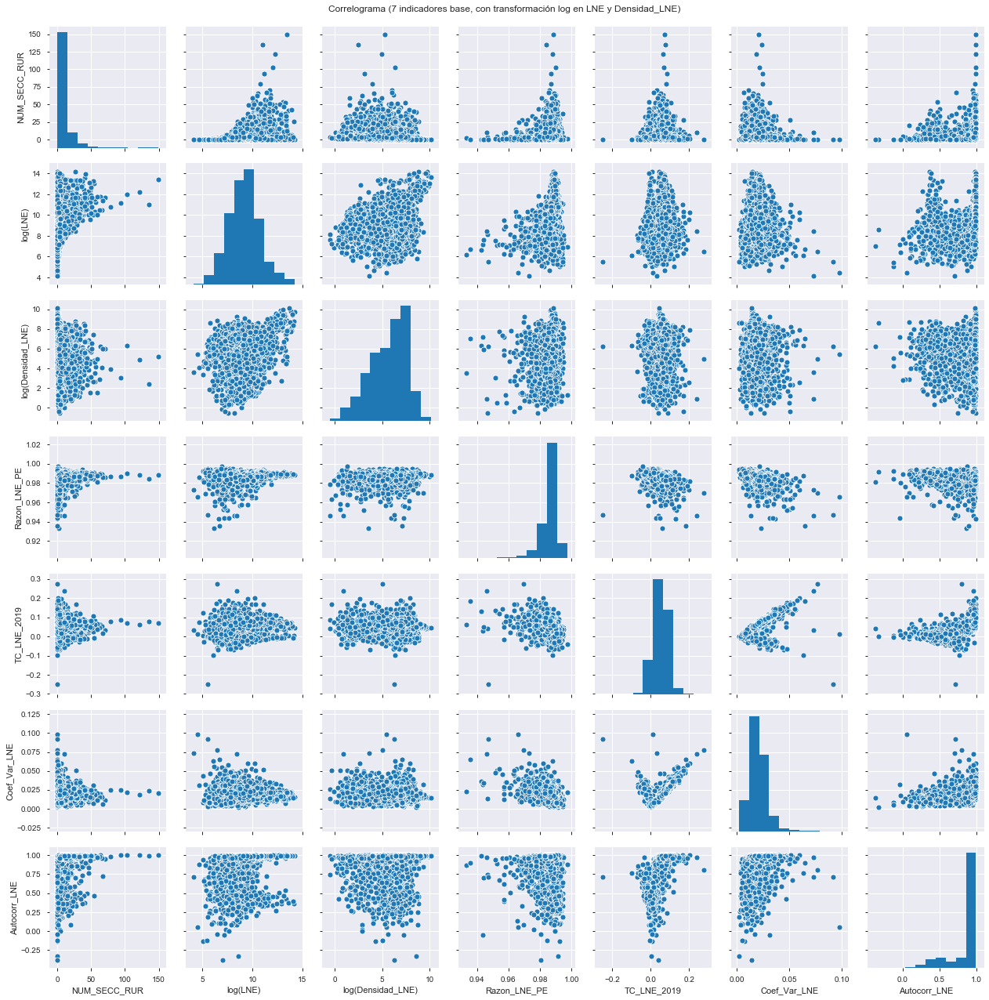

In [22]:
#pair-plot
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python/)
corr2_tf = sns.pairplot(datos_mun_limpio_f_tf_ind7)
corr2_tf.fig.suptitle("Correlograma (7 indicadores base, con transformación log en LNE y Densidad_LNE)", y=1.01)
corr2_tf.savefig('Pyplot_correlogram_ind7_tf.png',dpi=600)

<br>

# Análisis de Componentes Principales (PCA)

### Preprocesamiento de datos

In [23]:
from sklearn.preprocessing import StandardScaler

#Se crean listas para separar los tipos/escenarios de datos

#seleccionamos 7 indicadores
ind7 = ['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']

#seleccionamos 7 indicadores (con log)
ind7_tf = ['NUM_SECC_RUR','log(LNE)', 'log(Densidad_LNE)', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Autocorr_LNE']

#seleccionamos 8 indicadores
ind8 = ['NUM_SECC_RUR','LNE', 'Densidad_LNE', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE']

#seleccionamos 8 indicadores (con log)
ind8_tf = ['NUM_SECC_RUR','log(LNE)', 'log(Densidad_LNE)', 'Razon_LNE_PE', 'TC_LNE_2019', 'Coef_Var_LNE', 'Var_Prop_LNE', 'Autocorr_LNE']

#etiquetas
labels = ['EDO', 'NOMBRE_ESTADO', 'MUN', 'NOMBRE_MUNICIPIO']


#seleccionamos los valores de solo 7 indicadores (sin Var_Prop_LNE)
x = datos_mun_limpio_f.loc[:, ind7].values

#seleccionamos los valores de solo 7 indicadores (sin Var_Prop_LNE y con log)
x_1 = datos_mun_limpio_f_tf.loc[:, ind7_tf].values

#seleccionamos los valores de los 8 indicadores originales
x_2 = datos_mun_limpio_f.loc[:, ind8].values

#seleccionamos los valores de los 8 indicadores con transformacion log en LNE y Densidad
x_3 = datos_mun_limpio_f_tf.loc[:, ind8_tf].values

#seleccionamos las labels (metadatos)
y = metadatos.loc[:,labels].values

print(x.shape)
print(x_1.shape)
print(x_2.shape)
print(x_3.shape)
print(y.shape)

(2458, 7)
(2458, 7)
(2458, 8)
(2458, 8)
(2458, 4)


In [24]:
#para verificar que no haya valores nulos o infinitos en ind7
print(np.any(np.isnan(x)))
print(np.all(np.isfinite(x)))

#para verificar que no haya valores nulos o infinitos en ind7_tf
print(np.any(np.isnan(x_1)))
print(np.all(np.isfinite(x_1)))

#para verificar que no haya valores nulos o infinitos en ind8
print(np.any(np.isnan(x_2)))
print(np.all(np.isfinite(x_2)))

#para verificar que no haya valores nulos o infinitos en ind8_tf
print(np.any(np.isnan(x_3)))
print(np.all(np.isfinite(x_3)))

False
True
False
True
False
True
False
True


In [25]:
#Estandarizamos los valores de ind7 (normalización)
x = StandardScaler().fit_transform(x)
print(x.shape)

#Estandarizamos los valores de ind7_tf (normalización)
x_1 = StandardScaler().fit_transform(x_1)
print(x_1.shape)

#Estandarizamos los valores de ind8 (normalización)
x_2 = StandardScaler().fit_transform(x_2)
print(x_2.shape)

#Estandarizamos los valores de ind8_tf (normalización)
x_3 = StandardScaler().fit_transform(x_3)
print(x_3.shape)

(2458, 7)
(2458, 7)
(2458, 8)
(2458, 8)


<br>

## PCA con 7 indicadores

In [26]:
from sklearn.decomposition import PCA

#calculo de PCA (con las 7 componentes), y obtención de los valores CP para cada municipio
pca_7cp = PCA(n_components=7)
pca_ind7 = pca_7cp.fit_transform(x)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=7): %s'
      % str(pca_7cp.explained_variance_ratio_))

#dataframe con los valores de los 7 CP por municipio
df_pca_ind7 = pd.DataFrame(data = pca_ind7
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_ind7

Razón de varianza explicada por cada CP (n_components=7): [0.30367922 0.23119924 0.17996255 0.13085075 0.06754998 0.05200724
 0.03475101]


,CP1,CP2,CP3,CP4,CP5,CP6,CP7
0,-1.061899,0.788043,-0.837586,-0.614461,-0.088128,-0.782747,-0.238578
1,-3.242619,-1.163180,-0.391435,0.193575,0.880911,0.128676,-1.012632
2,-2.714649,-0.207140,-0.939179,0.184211,0.615393,-0.770295,-0.744057
3,-2.489077,-0.324405,-0.411126,-0.029804,0.468563,-0.389211,-0.141379
4,-2.499466,-0.395191,-0.509621,0.718468,0.620966,-0.484175,-0.511286
...,...,...,...,...,...,...,...
2453,0.548172,-0.308683,0.679952,0.209243,-0.452260,0.088731,-0.062292
2454,0.875699,0.306366,1.949664,0.996421,0.061302,-0.572234,-0.267121
2455,1.864008,-0.162682,0.715202,0.470561,0.292022,-0.127472,-0.194333
2456,0.886651,-0.151959,0.337662,0.033250,-0.481215,-0.003173,-0.078652


In [27]:
#obtención de los pesos por cada variable
pca_pesos_ind7 = pca_7cp.components_
print(pca_pesos_ind7)

#transformación a un dataframe:
df_pca_pesos_ind7 = pd.DataFrame(pca_pesos_ind7, columns=ind7)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_pesos_ind7.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind7.to_csv(r'Resultados_Mun_PCA_pesos_ind7.csv', index = None)

df_pca_pesos_ind7=df_pca_pesos_ind7.set_index('Componentes Principales')
df_pca_pesos_ind7

[[-0.01939582 -0.06200948 -0.04362646 -0.33486759  0.61225314  0.55376069
   0.44747541]
 [ 0.20642117  0.65606456  0.57276414  0.29680151  0.1327594  -0.07962829
   0.29470998]
 [ 0.63877786 -0.15557432 -0.4884409   0.38620809  0.10449908 -0.20403254
   0.35704191]
 [ 0.62643947  0.34579351 -0.09475374 -0.52999761 -0.14960115  0.1970885
  -0.37000043]
 [-0.02175581  0.12584724 -0.15604309  0.60228767  0.03369482  0.65615222
  -0.4061012 ]
 [-0.39225078  0.63652744 -0.62970138 -0.07336563  0.05955904 -0.16926031
   0.0828823 ]
 [-0.04708013  0.03086899 -0.04014859 -0.03981769 -0.75467732  0.38386258
   0.52606546]]


,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Autocorr_LNE
Componentes Principales,,,,,,,
CP1,-0.019396,-0.062009,-0.043626,-0.334868,0.612253,0.553761,0.447475
CP2,0.206421,0.656065,0.572764,0.296802,0.132759,-0.079628,0.294710
CP3,0.638778,-0.155574,-0.488441,0.386208,0.104499,-0.204033,0.357042
CP4,0.626439,0.345794,-0.094754,-0.529998,-0.149601,0.197089,-0.370000
CP5,-0.021756,0.125847,-0.156043,0.602288,0.033695,0.656152,-0.406101
CP6,-0.392251,0.636527,-0.629701,-0.073366,0.059559,-0.169260,0.082882
CP7,-0.047080,0.030869,-0.040149,-0.039818,-0.754677,0.383863,0.526065


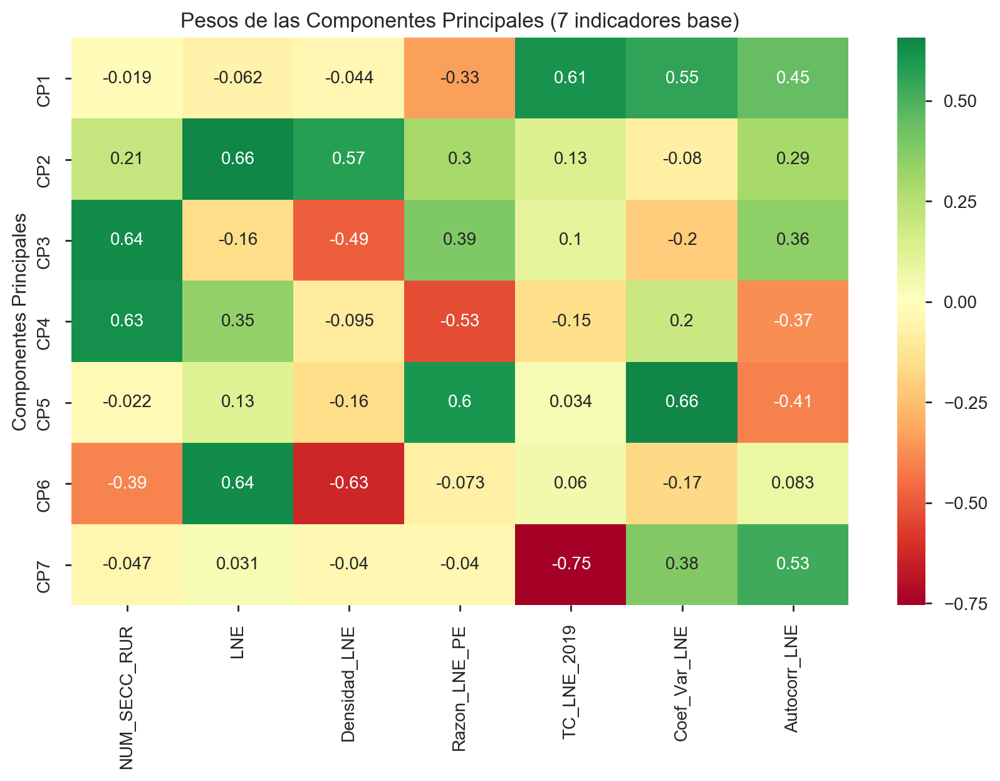

In [28]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind7, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (7 indicadores base)')

plt.savefig('Pyplot_PCA_heatmap_ind7.png',dpi=600,bbox_inches="tight")
plt.show() 

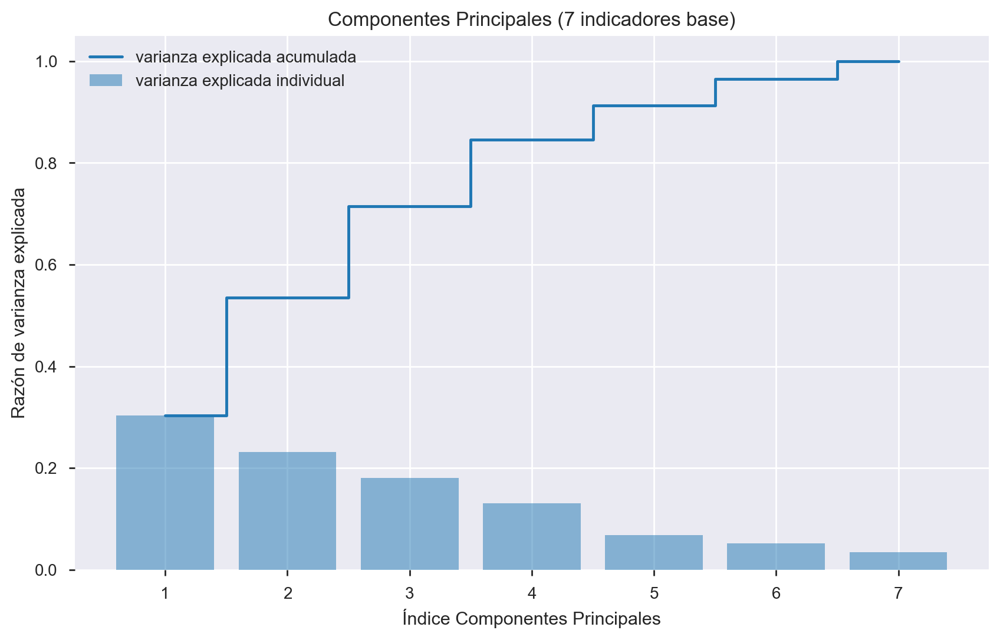

In [29]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,8), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,8), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (7 indicadores base)')

plt.savefig('Pyplot_PCA_variance_ind7.png',dpi=600)
plt.show()

In [30]:
#concatenamos los resultados con los metadatos
df_pca_results_ind7 = pd.concat([metadatos[labels], df_pca_ind7], axis = 1)
df_pca_results_ind7.head()
#salvar resultados PCA
df_pca_results_ind7.to_csv(r'Resultados_Mun_PCA_ind7.csv', index = None)

### Proyección de los municipios en el espacio de Componentes Principales (7 indicadores)
Gráfica en el espacio CP1, CP2

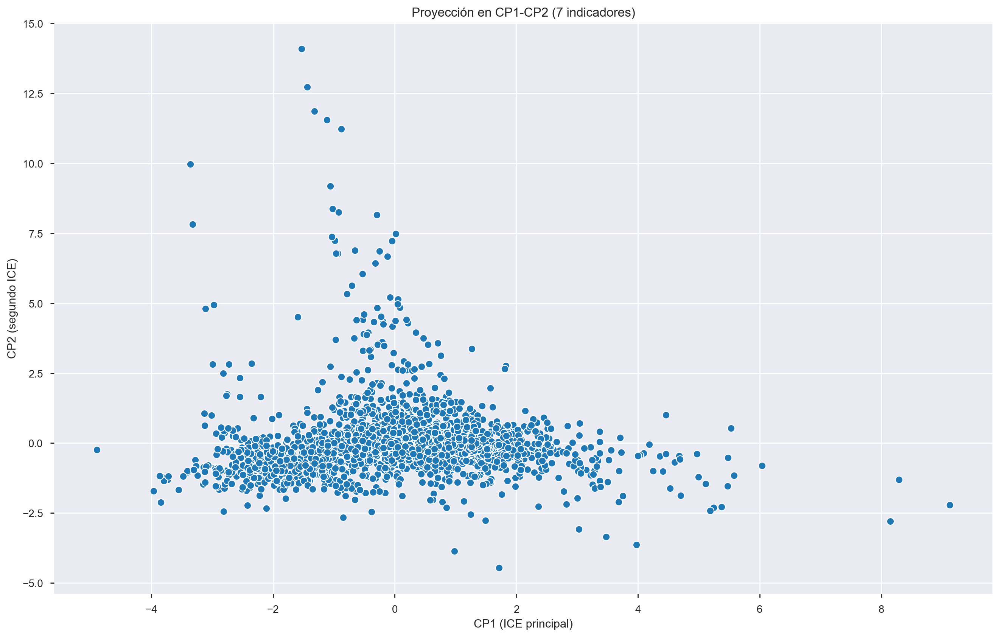

In [31]:
#Scatter plot (seaborn)  PC1 vs PC2
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind7)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (7 indicadores)')

plt.savefig('Pyplot_PCA_projection_ind7.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

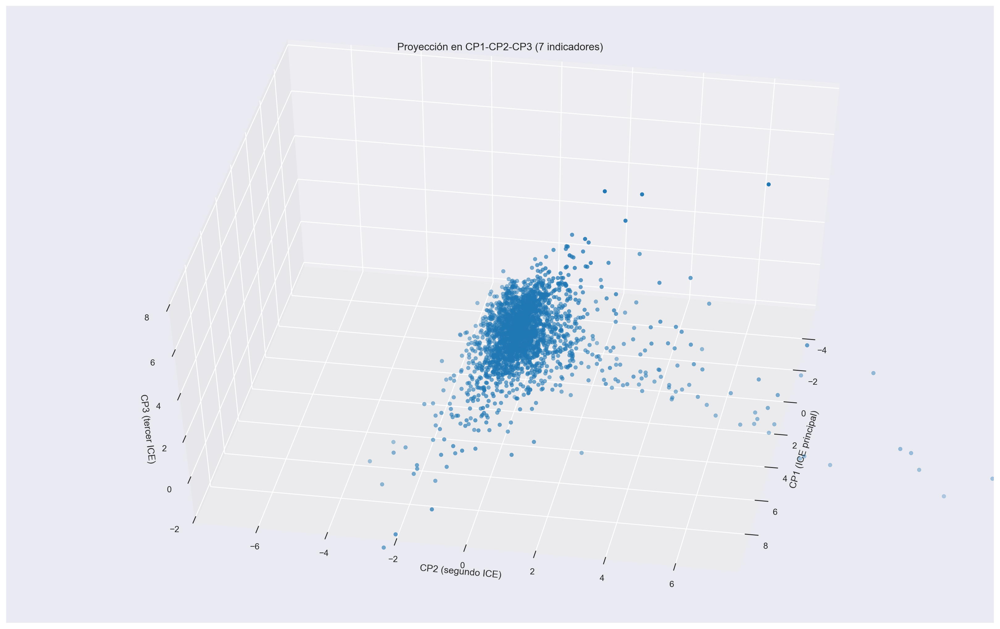

In [32]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind7['CP1'], df_pca_results_ind7['CP2'], df_pca_results_ind7['CP3'],s=20)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (7 indicadores)')

plt.savefig('Pyplot_PCA_3dprojection_ind7.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [33]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind7, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

## PCA con 7 indicadores (con transformación log en LNE y Densidad_LNE)

In [34]:
from sklearn.decomposition import PCA

#calculo de PCA (con las 7 componentes), y obtención de los valores CP para cada municipio
pca_7cp_tf = PCA(n_components=7)
pca_ind7_tf = pca_7cp_tf.fit_transform(x_1)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=7): %s'
      % str(pca_7cp_tf.explained_variance_ratio_))

#dataframe con los valores de los 7 CP por municipio
df_pca_ind7_tf = pd.DataFrame(data = pca_ind7_tf
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_ind7_tf

Razón de varianza explicada por cada CP (n_components=7): [0.30426836 0.25554083 0.17085312 0.12052755 0.06464616 0.04935993
 0.03480405]


,CP1,CP2,CP3,CP4,CP5,CP6,CP7
0,-0.995331,0.745533,-1.389633,0.434649,0.105639,-0.259502,-0.196240
1,-3.318903,-0.619987,0.723898,0.193995,-0.969311,-0.651817,-1.034857
2,-2.757468,0.081456,-0.908153,1.115722,-0.558179,-0.004696,-0.705979
3,-2.523745,0.260810,-0.738536,0.676101,-0.383889,-0.048412,-0.126217
4,-2.490247,0.453746,-0.450692,1.507864,-0.496284,-0.207700,-0.497406
...,...,...,...,...,...,...,...
2453,0.566375,-0.038837,1.137560,-0.402981,0.304617,0.000411,-0.066702
2454,1.080969,1.300230,2.208190,-0.057168,-0.342807,0.496959,-0.236424
2455,1.911600,0.178614,0.950089,0.065079,-0.393423,0.058249,-0.192537
2456,0.851114,0.072100,-0.200368,0.061119,0.545074,0.389442,-0.072882


In [35]:
#obtención de los pesos por cada variable
pca_pesos_ind7_tf = pca_7cp_tf.components_
print(pca_pesos_ind7_tf)

#transformación a un dataframe:
df_pca_pesos_ind7_tf = pd.DataFrame(pca_pesos_ind7_tf, columns=ind7_tf)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7'])
df_pca_pesos_ind7_tf.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind7_tf.to_csv(r'Resultados_Mun_PCA_pesos_ind7_tf.csv', index = None)

df_pca_pesos_ind7_tf=df_pca_pesos_ind7_tf.set_index('Componentes Principales')
df_pca_pesos_ind7_tf

[[ 0.03712315  0.07978574 -0.041561   -0.29629231  0.6206983   0.5361376
   0.47961417]
 [ 0.49568362  0.62753931  0.14801385  0.44768069  0.05830592 -0.20733901
   0.30294722]
 [ 0.53327086 -0.07089072 -0.81003823 -0.20361565 -0.07785194 -0.06140277
  -0.05607316]
 [ 0.33393058  0.37596873  0.34337486 -0.51258359 -0.17382621  0.30610584
  -0.49251733]
 [-0.02090865  0.02794903  0.16768404 -0.63069504 -0.03203015 -0.64876276
   0.3885466 ]
 [ 0.59682665 -0.6726597   0.41732553  0.09203143  0.05356238  0.01262841
   0.07528676]
 [-0.01982305 -0.01408737  0.00422193 -0.0366822  -0.75575307  0.38864293
   0.52520391]]


,NUM_SECC_RUR,log(LNE),log(Densidad_LNE),Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Autocorr_LNE
Componentes Principales,,,,,,,
CP1,0.037123,0.079786,-0.041561,-0.296292,0.620698,0.536138,0.479614
CP2,0.495684,0.627539,0.148014,0.447681,0.058306,-0.207339,0.302947
CP3,0.533271,-0.070891,-0.810038,-0.203616,-0.077852,-0.061403,-0.056073
CP4,0.333931,0.375969,0.343375,-0.512584,-0.173826,0.306106,-0.492517
CP5,-0.020909,0.027949,0.167684,-0.630695,-0.032030,-0.648763,0.388547
CP6,0.596827,-0.672660,0.417326,0.092031,0.053562,0.012628,0.075287
CP7,-0.019823,-0.014087,0.004222,-0.036682,-0.755753,0.388643,0.525204


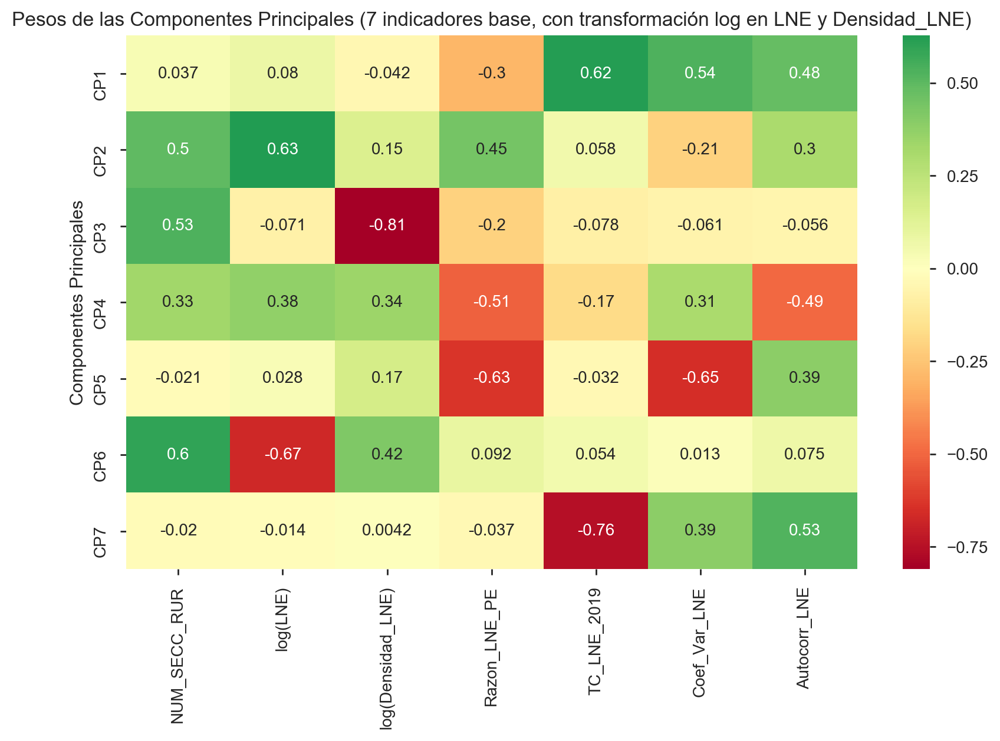

In [36]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind7_tf, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (7 indicadores base, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_heatmap_ind7_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

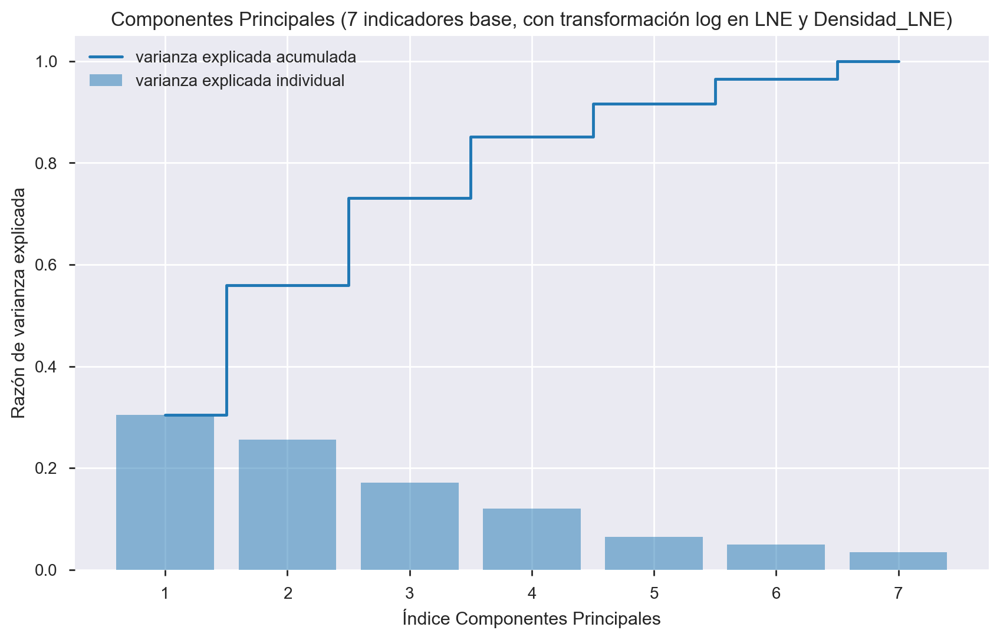

In [37]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x_1.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,8), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,8), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (7 indicadores base, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_variance_ind7_tf.png',dpi=600)
plt.show()

In [38]:
#concatenamos los resultados con los metadatos
df_pca_results_ind7_tf = pd.concat([metadatos[labels], df_pca_ind7_tf], axis = 1)
df_pca_results_ind7_tf.head()
#salvar resultados PCA
df_pca_results_ind7_tf.to_csv(r'Resultados_Mun_PCA_ind7_tf.csv', index = None)

### Proyección de los municipios en el espacio de Componentes Principales (7 indicadores con transformación log)
Gráfica en el espacio CP1, CP2

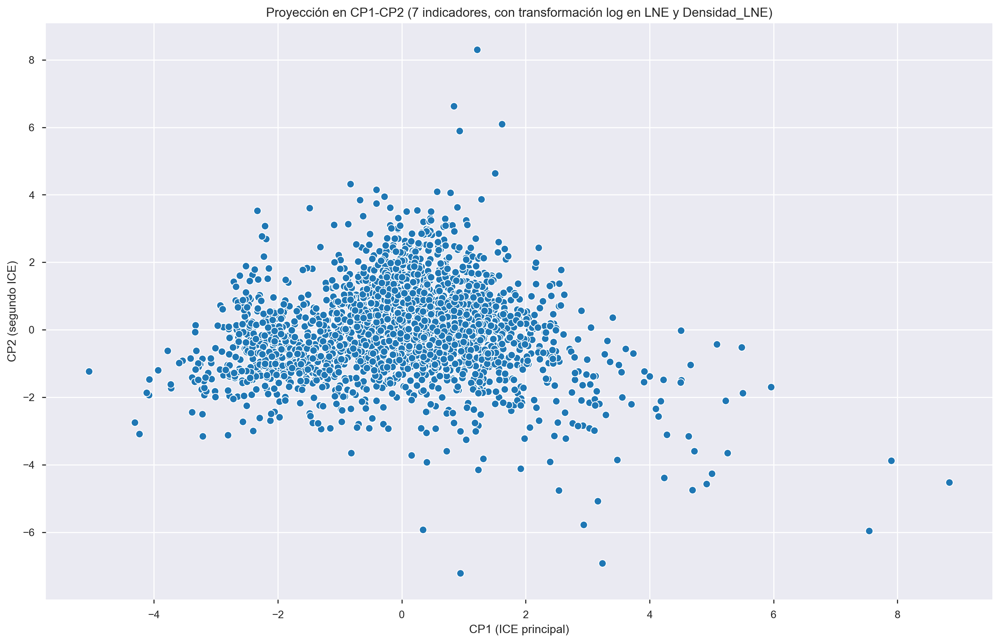

In [39]:
#Scatter plot (seaborn)  PC1 vs PC2
#(see https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python)

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind7_tf)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (7 indicadores, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_projection_ind7_tf.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

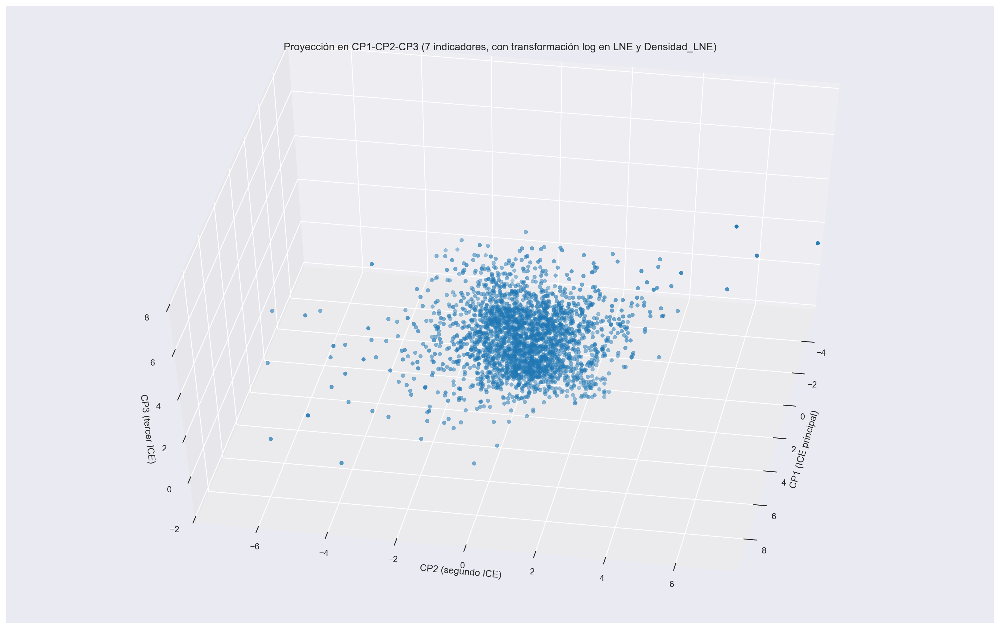

In [40]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind7_tf['CP1'], df_pca_results_ind7_tf['CP2'], df_pca_results_ind7_tf['CP3'],s=20)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (7 indicadores, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_3dprojection_ind7_tf.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [41]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind7_tf, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

## PCA con 8 indicadores

In [42]:
from sklearn.decomposition import PCA

#calculo de PCA con 3 componentes, y obtención de los valores de CP para cada municipio
pca_8cp = PCA(n_components=8)
pca_ind8 = pca_8cp.fit_transform(x_2)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=8): %s'
      % str(pca_8cp.explained_variance_ratio_))

#dataframe con los valores de los CP por municipio
df_pca_ind8 = pd.DataFrame(data = pca_ind8
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7', 'CP8'])
df_pca_ind8

Razón de varianza explicada por cada CP (n_components=8): [0.36461114 0.20268065 0.16109618 0.1171419  0.0753176  0.04588586
 0.03214751 0.00111917]


,CP1,CP2,CP3,CP4,CP5,CP6,CP7,CP8
0,-1.212730,0.714345,0.923540,-0.603382,-0.084640,-0.782450,-0.261916,-0.003056
1,-3.406688,-1.362798,0.754667,0.415810,-0.885600,0.272844,-1.093298,0.029088
2,-2.795431,-0.391567,1.266848,0.337623,-0.693461,-0.657287,-0.864759,0.099806
3,-2.524197,-0.487015,0.724376,0.172457,-0.717782,-0.340382,-0.187773,-0.019983
4,-2.419575,-0.569647,0.875752,0.915294,-0.718031,-0.391693,-0.592203,-0.023749
...,...,...,...,...,...,...,...,...
2453,0.293567,-0.246173,-0.802060,0.124052,0.581356,0.047280,-0.025936,0.065240
2454,0.752369,0.392485,-1.955040,1.087186,-0.002043,-0.540422,-0.324093,0.042029
2455,2.209573,-0.054915,-0.842182,0.460205,-0.155634,-0.075444,-0.244536,-0.061517
2456,0.749358,-0.079880,-0.495159,-0.084159,0.593947,-0.049198,-0.034575,-0.001863


In [43]:
#obtención de los pesos por cada variable
pca_pesos_ind8 = pca_8cp.components_
print(pca_pesos_ind8)

#transformación a un dataframe:
df_pca_pesos_ind8 = pd.DataFrame(pca_pesos_ind8, columns=ind8)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7', 'CP8'])
df_pca_pesos_ind8.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind8.to_csv(r'Resultados_Mun_PCA_pesos_ind8.csv', index = None)

df_pca_pesos_ind8=df_pca_pesos_ind8.set_index('Componentes Principales')
df_pca_pesos_ind8

[[-4.47027069e-02 -5.11044776e-02 -3.00395732e-02 -3.01730328e-01
   4.75659162e-01  5.39063231e-01  5.46039513e-01  2.97399528e-01]
 [ 2.12407649e-01  6.43731771e-01  5.59072834e-01  2.77667271e-01
   1.81456831e-01 -5.04208174e-02 -3.06977188e-02  3.38259753e-01]
 [-5.78163780e-01  2.04900221e-01  4.96915852e-01 -3.06664772e-01
  -2.18181670e-01  1.43370670e-01  1.21700457e-01 -4.46994972e-01]
 [ 6.80052077e-01  3.45402309e-01 -1.27804359e-01 -3.75796767e-01
  -2.26338121e-01  1.60816182e-01  1.33465055e-01 -4.07143149e-01]
 [ 5.53902407e-03 -1.16020458e-02  9.31186714e-02 -7.65666787e-01
   1.77812682e-01 -3.77981602e-01 -3.68133715e-01  3.08071619e-01]
 [-3.89256140e-01  6.47354242e-01 -6.41118431e-01 -8.29398855e-03
   1.09887046e-01 -5.86577151e-02 -5.24678883e-02  6.46067760e-03]
 [-6.76691208e-02  5.00601087e-02 -5.97647035e-02 -1.00984975e-01
  -7.73363616e-01  1.49974329e-01  1.49933408e-01  5.79725351e-01]
 [-3.21587112e-03  1.65763379e-03  3.50500856e-04  8.98997592e-03
   

,NUM_SECC_RUR,LNE,Densidad_LNE,Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
Componentes Principales,,,,,,,,
CP1,-0.044703,-0.051104,-0.030040,-0.301730,0.475659,0.539063,0.546040,0.297400
CP2,0.212408,0.643732,0.559073,0.277667,0.181457,-0.050421,-0.030698,0.338260
CP3,-0.578164,0.204900,0.496916,-0.306665,-0.218182,0.143371,0.121700,-0.446995
CP4,0.680052,0.345402,-0.127804,-0.375797,-0.226338,0.160816,0.133465,-0.407143
CP5,0.005539,-0.011602,0.093119,-0.765667,0.177813,-0.377982,-0.368134,0.308072
CP6,-0.389256,0.647354,-0.641118,-0.008294,0.109887,-0.058658,-0.052468,0.006461
CP7,-0.067669,0.050060,-0.059765,-0.100985,-0.773364,0.149974,0.149933,0.579725
CP8,-0.003216,0.001658,0.000351,0.008990,0.014346,0.701176,-0.712404,0.023075


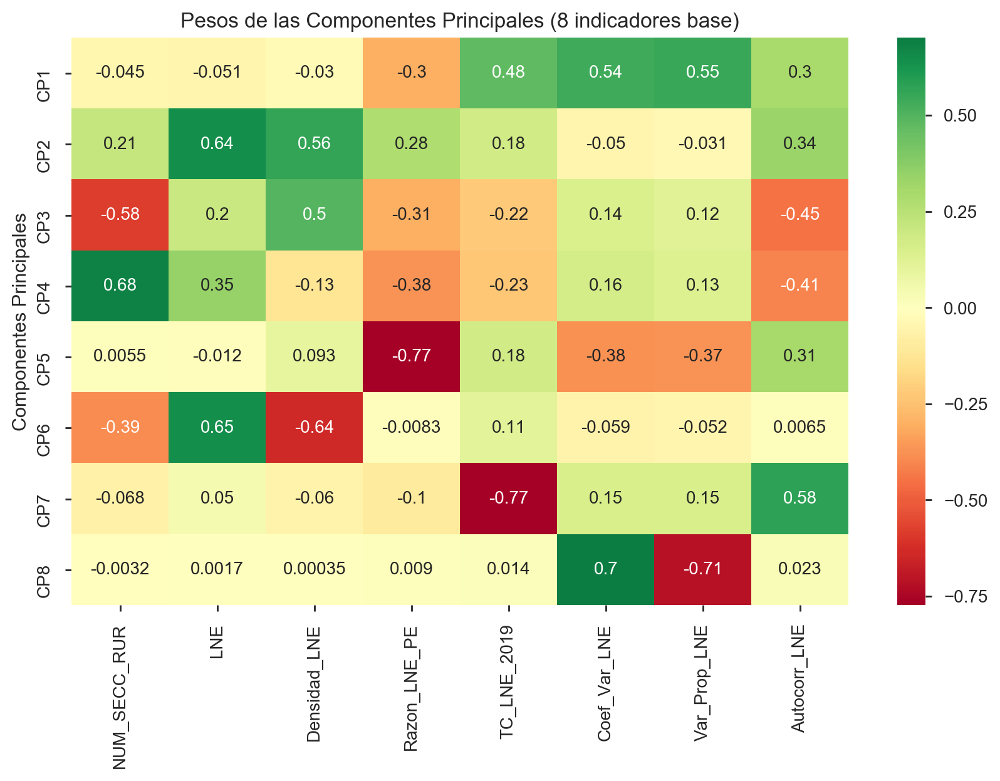

In [44]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind8, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (8 indicadores base)')

plt.savefig('Pyplot_PCA_heatmap_ind8.png',dpi=600,bbox_inches="tight")
plt.show() 

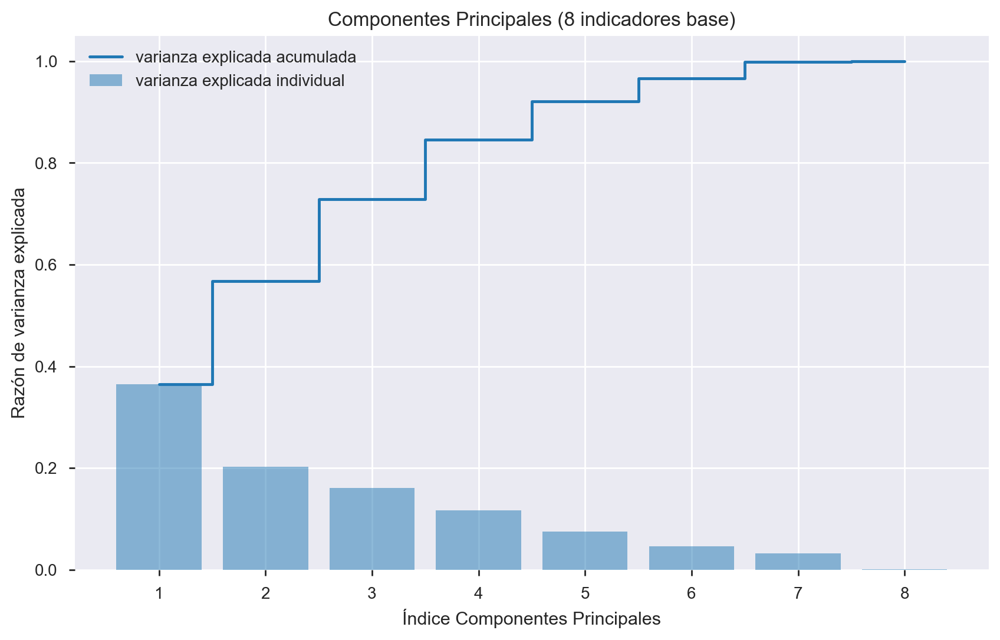

In [45]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x_2.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,9), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,9), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (8 indicadores base)')

plt.savefig('Pyplot_PCA_variance_ind8.png',dpi=600)
plt.show()

In [46]:
#concatenamos los resultados con los metadatos
df_pca_results_ind8 = pd.concat([metadatos[labels], df_pca_ind8], axis = 1)
df_pca_results_ind8.head()
#salvar resultados PCA
df_pca_results_ind8.to_csv(r'Resultados_Mun_PCA_ind8.csv', index = None)

### Proyección de los municipios en el espacio de Componentes Principales (8 indicadores)
Gráfica en el espacio CP1, CP2

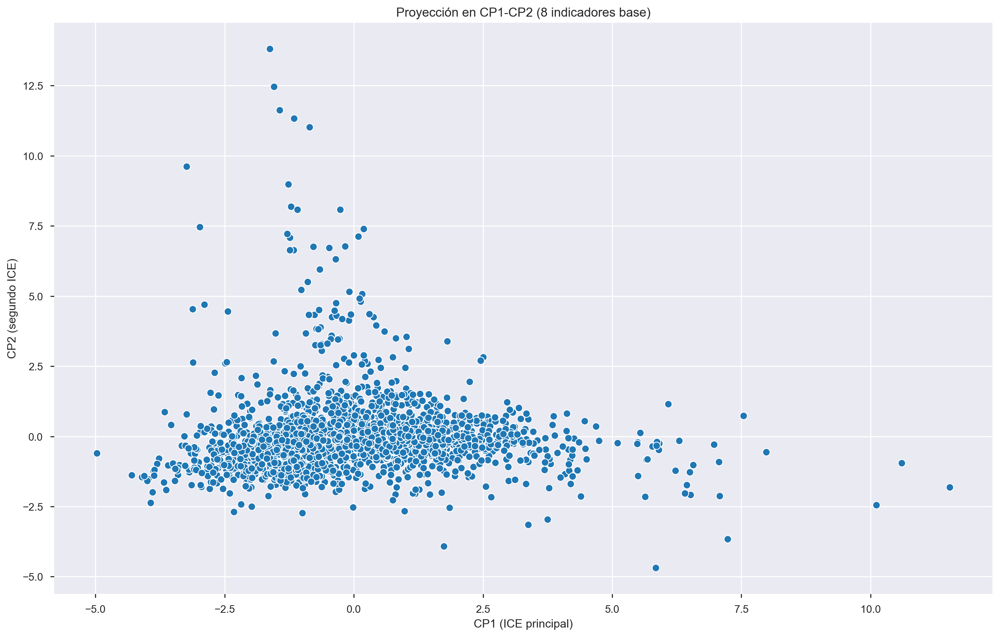

In [47]:
#Scatter plot (seaborn) PC1 vs PC2

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind8)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (8 indicadores base)')

plt.savefig('Pyplot_PCA_projection_ind8.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

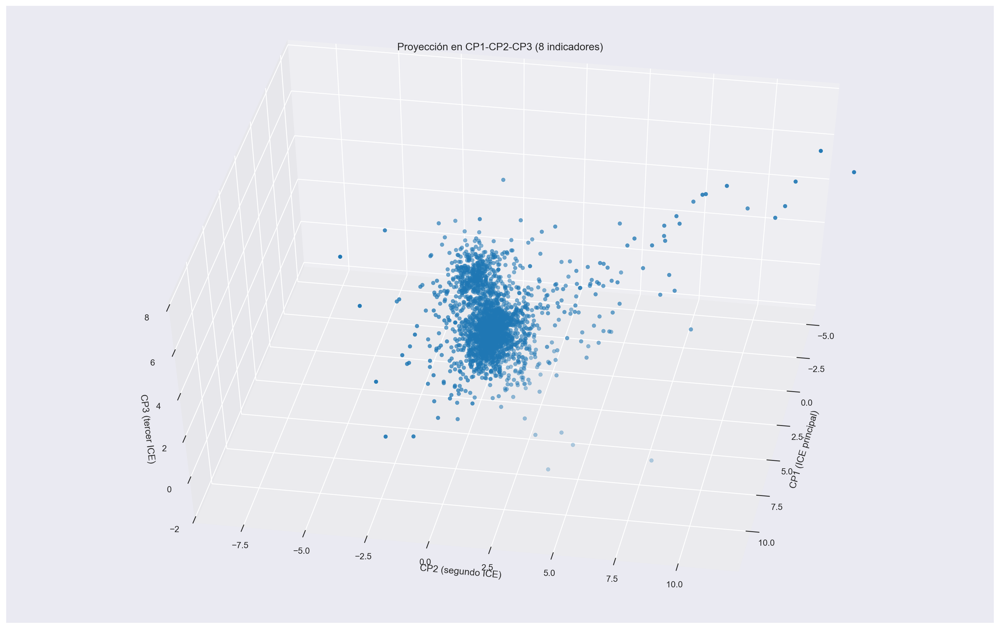

In [59]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind8['CP1'], df_pca_results_ind8['CP2'], df_pca_results_ind8['CP3'],s=20)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-9,12)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (8 indicadores)')

plt.savefig('Pyplot_PCA_3dprojection_ind8.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [49]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind8, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

## PCA con 8 indicadores (transformación log en LNE y Densidad)

In [50]:
from sklearn.decomposition import PCA

#calculo de PCA con 8 componentes, y obtención de los valores de CP para cada municipio
pca_8cp_tf = PCA(n_components=8)
pca_ind8_tf = pca_8cp_tf.fit_transform(x_3)

#razones de varianza explicada por cada CP 
print('Razón de varianza explicada por cada CP (n_components=8): %s'
      % str(pca_8cp_tf.explained_variance_ratio_))

#dataframe con los valores de los CP por municipio
df_pca_ind8_tf = pd.DataFrame(data = pca_ind8_tf
             , columns = ['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7', 'CP8'])
df_pca_ind8_tf

Razón de varianza explicada por cada CP (n_components=8): [0.36413509 0.22628153 0.1500644  0.11257737 0.07042087 0.0431925
 0.03223346 0.00109478]


,CP1,CP2,CP3,CP4,CP5,CP6,CP7,CP8
0,-1.214070,0.513032,-1.450945,0.431519,0.182643,-0.259314,-0.187243,0.010094
1,-3.422301,-1.284015,0.577059,0.648052,-0.969611,-0.638014,-1.147983,0.037785
2,-2.820073,-0.517094,-1.072523,1.362320,-0.340752,0.004996,-0.799488,0.107345
3,-2.557359,-0.295472,-0.890254,0.975709,-0.418065,-0.044813,-0.157649,-0.013624
4,-2.449705,-0.118811,-0.643405,1.811638,-0.307746,-0.200200,-0.563693,-0.009320
...,...,...,...,...,...,...,...,...
2453,0.294566,0.126657,1.201204,-0.512943,0.306917,-0.001819,-0.039371,0.061847
2454,0.770249,1.514170,2.214195,0.063605,-0.312969,0.501606,-0.285044,0.033742
2455,2.207745,0.543961,0.993419,0.054510,-0.291653,0.063391,-0.248878,-0.062676
2456,0.723186,0.265904,-0.141626,-0.185856,0.667093,0.385281,-0.014308,-0.006761


In [51]:
#obtención de los pesos por cada variable
pca_pesos_ind8_tf = pca_8cp_tf.components_
print(pca_pesos_ind8_tf)

#transformación a un dataframe:
df_pca_pesos_ind8_tf = pd.DataFrame(pca_pesos_ind8_tf, columns=ind8_tf)
principal_components_pesos = pd.DataFrame(['CP1', 'CP2', 'CP3','CP4', 'CP5', 'CP6','CP7', 'CP8'])
df_pca_pesos_ind8_tf.insert(0, 'Componentes Principales', principal_components_pesos)

#se guarda el último dataframe en un csv
df_pca_pesos_ind8_tf.to_csv(r'Resultados_Mun_PCA_pesos_ind8_tf.csv', index = None)

df_pca_pesos_ind8_tf=df_pca_pesos_ind8_tf.set_index('Componentes Principales')
df_pca_pesos_ind8_tf

[[-0.0416377  -0.01049903 -0.02497581 -0.30097122  0.47723623  0.53919832
   0.54626773  0.30008487]
 [ 0.48890597  0.6211664   0.12366233  0.3630325   0.20591857 -0.09112798
  -0.06373864  0.41625582]
 [ 0.50660857 -0.0964838  -0.82180809 -0.23009015 -0.02831334 -0.04465148
  -0.05319988 -0.01014808]
 [ 0.38065859  0.37800153  0.26474211 -0.30286612 -0.31480661  0.25280729
   0.2256517  -0.58005534]
 [ 0.0232916   0.09370173  0.2550822  -0.7830725   0.14987029 -0.34631715
  -0.33632876  0.23852528]
 [ 0.59717761 -0.67243491  0.41608029  0.09741054  0.05849312  0.02142556
  -0.00461052  0.06853335]
 [-0.0194483  -0.02368856  0.02057325 -0.10115548 -0.77709321  0.15318764
   0.15153797  0.58146441]
 [-0.01192519  0.01838277 -0.00373066  0.00553005  0.01348588  0.7008527
  -0.71251526  0.02051823]]


,NUM_SECC_RUR,log(LNE),log(Densidad_LNE),Razon_LNE_PE,TC_LNE_2019,Coef_Var_LNE,Var_Prop_LNE,Autocorr_LNE
Componentes Principales,,,,,,,,
CP1,-0.041638,-0.010499,-0.024976,-0.300971,0.477236,0.539198,0.546268,0.300085
CP2,0.488906,0.621166,0.123662,0.363032,0.205919,-0.091128,-0.063739,0.416256
CP3,0.506609,-0.096484,-0.821808,-0.230090,-0.028313,-0.044651,-0.053200,-0.010148
CP4,0.380659,0.378002,0.264742,-0.302866,-0.314807,0.252807,0.225652,-0.580055
CP5,0.023292,0.093702,0.255082,-0.783072,0.149870,-0.346317,-0.336329,0.238525
CP6,0.597178,-0.672435,0.416080,0.097411,0.058493,0.021426,-0.004611,0.068533
CP7,-0.019448,-0.023689,0.020573,-0.101155,-0.777093,0.153188,0.151538,0.581464
CP8,-0.011925,0.018383,-0.003731,0.005530,0.013486,0.700853,-0.712515,0.020518


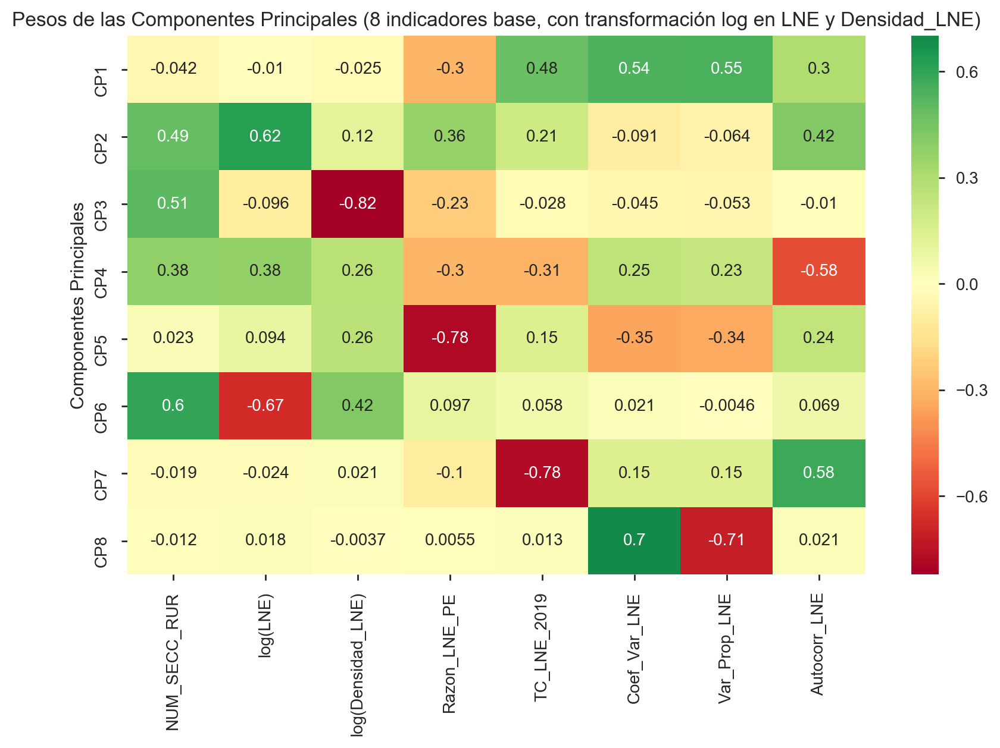

In [52]:
plt.figure(figsize=(10,6), dpi= 200)
sns.heatmap(df_pca_pesos_ind8_tf, cmap='RdYlGn', center=0, annot=True)
# fix for mpl bug that cuts off top/bottom of seaborn viz (see https://github.com/mwaskom/seaborn/issues/1773)
b, t = plt.ylim() # discover the values for bottom and top
b += 0.5 # Add 0.5 to the bottom
t -= 0.5 # Subtract 0.5 from the top
plt.ylim(b, t) # update the ylim(bottom, top) values
plt.title('Pesos de las Componentes Principales (8 indicadores base, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_heatmap_ind8_tf.png',dpi=600,bbox_inches="tight")
plt.show() 

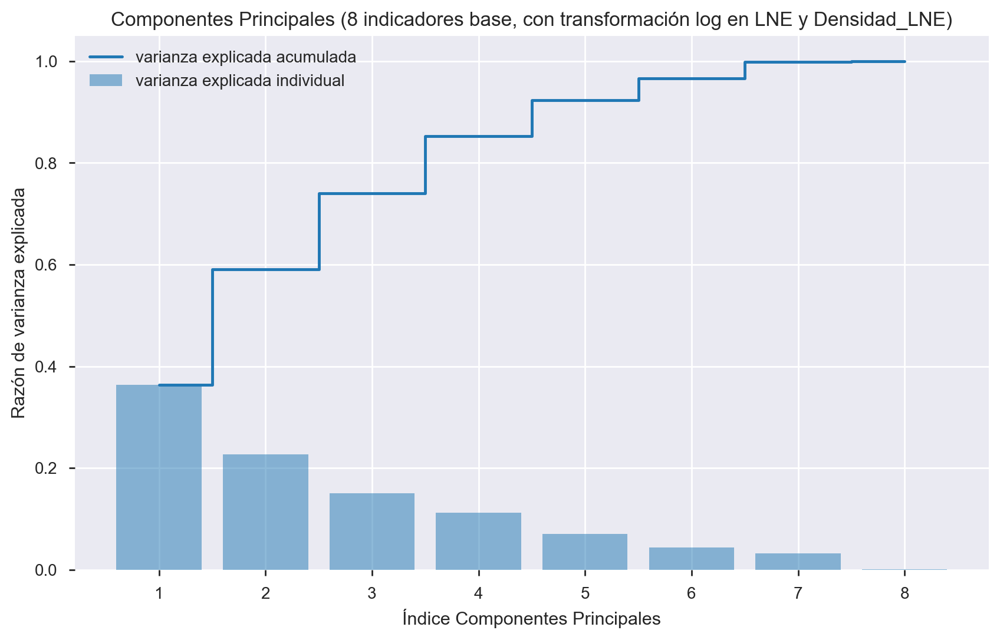

In [53]:

#calculo de la matriz de covarianza y sus correspondientes eigenvalores y eigenvectores
cov_mat = np.cov(x_3.T)
eigen_vals, eigen_vecs = np.linalg.eig(cov_mat)

# calculate of individual and cumulative sum of explained variances
tot = sum(eigen_vals)
var_exp = [(i / tot) for i in sorted(eigen_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)

# plot explained variances
plt.figure(figsize=(10,6), dpi= 200)
plt.bar(range(1,9), var_exp, alpha=0.5,
        align='center', label='varianza explicada individual')
plt.step(range(1,9), cum_var_exp, where='mid',
         label='varianza explicada acumulada')
plt.ylabel('Razón de varianza explicada')
plt.xlabel('Índice Componentes Principales')
plt.legend(loc='best')
plt.title('Componentes Principales (8 indicadores base, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_variance_ind8_tf.png',dpi=600)
plt.show()

In [54]:
#concatenamos los resultados con los metadatos
df_pca_results_ind8_tf = pd.concat([metadatos[labels], df_pca_ind8_tf], axis = 1)
df_pca_results_ind8_tf.head()
#salvar resultados PCA
df_pca_results_ind8_tf.to_csv(r'Resultados_Mun_PCA_ind8_tf.csv', index = None)

### Proyección de los municipios en el espacio de Componentes Principales (8 indicadores con transformación log)
Gráfica en el espacio CP1, CP2

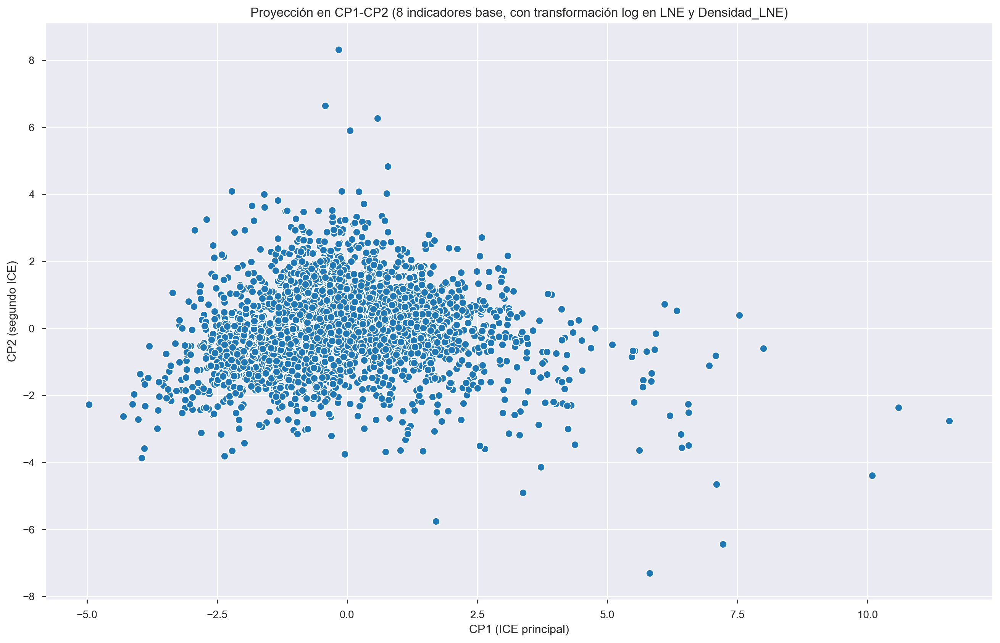

In [55]:
#Scatter plot (seaborn) PC1 vs PC2

plt.figure(figsize=(16, 10), dpi= 200, facecolor='w', edgecolor='k')
sns.scatterplot(x="CP1", y="CP2", 
                data=df_pca_results_ind8_tf)
# Set x-axis label
plt.xlabel('CP1 (ICE principal)')
# Set y-axis label
plt.ylabel('CP2 (segundo ICE)')
plt.title('Proyección en CP1-CP2 (8 indicadores base, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_projection_ind8_tf.png',dpi=600)

Gráfica en el espacio CP1, CP2, CP3

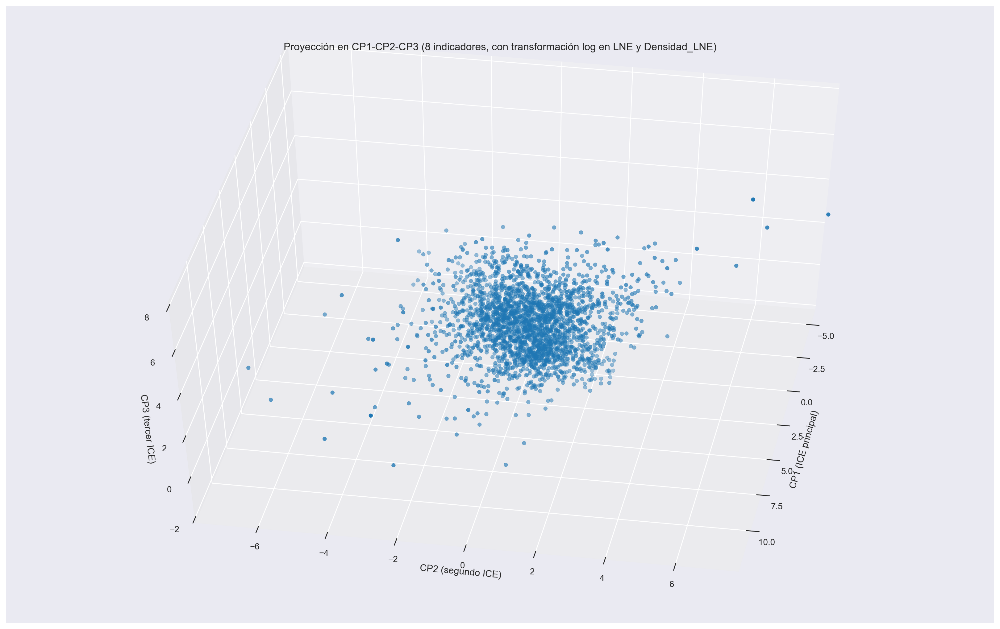

In [56]:
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D

fig = pyplot.figure(figsize=(16, 10), dpi=200, facecolor='w', edgecolor='k')
ax = Axes3D(fig)
ax.scatter(df_pca_results_ind8_tf['CP1'], df_pca_results_ind8_tf['CP2'], df_pca_results_ind8_tf['CP3'],s=20)
# ax.set_xlim3d(-10, 40)
ax.set_ylim3d(-7.5,7.5)
ax.set_zlim3d(-2,8)
ax.set_xlabel('CP1 (ICE principal)')
ax.set_ylabel('CP2 (segundo ICE)')
ax.set_zlabel('CP3 (tercer ICE)')
ax.view_init(elev, azim)
ax.set_title('Proyección en CP1-CP2-CP3 (8 indicadores, con transformación log en LNE y Densidad_LNE)')

plt.savefig('Pyplot_PCA_3dprojection_ind8_tf.png',dpi=600)
pyplot.show()

Gráfica 3d animada

In [57]:
# import plotly.express as px

# fig = px.scatter_3d(df_pca_results_ind8_tf, 
#                     x='CP1', 
#                     y='CP2', 
#                     z='CP3')
# fig.update_layout(scene = dict(
#                     xaxis_title='CP1 (ICE principal)',
#                     yaxis_title='CP2 (segundo ICE)',
#                     zaxis_title='CP3 (tercer ICE)'),
#                  legend_orientation="h")
# fig.show()

<br>

## Referencias
- https://www.analyticsvidhya.com/blog/2018/08/dimensionality-reduction-techniques-python/
- https://plot.ly/python/v3/ipython-notebooks/principal-component-analysis/#pca-vs-lda
- https://www.machinelearningplus.com/plots/top-50-matplotlib-visualizations-the-master-plots-python
- https://towardsdatascience.com/visualising-high-dimensional-datasets-using-pca-and-t-sne-in-python-8ef87e7915b
- https://alexanderfabisch.github.io/t-sne-in-scikit-learn.html
- https://medium.com/@indreshbhattacharyya/feature-selection-categorical-feature-selection-boruta-light-gbm-chi-square-bf47e94e2558
- https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
- https://stackoverflow.com/questions/52472757/creating-a-boxplot-facetgrid-in-seaborn-for-python
- https://www.kdnuggets.com/2019/07/10-simple-hacks-speed-data-analysis-python.html
- https://github.com/adam-p/markdown-here/wiki/Markdown-Here-Cheatsheet